# Unsupervised Learning Predict
### Honour Code

I 2307ACDS TEAM EG1, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Introduction</a>

<a href=#one>2. Importing Packages</a>

<a href=#one>3. Load Dataset</a>

<a href=#two>4. Exploratory Data Analysis</a>

<a href=#three>5. Preprocessing</a>

<a href=#four>6. Modelling</a>

<a href=#five>7. Model Evaluation</a>

<a href=#six>8. Prepare Submission File</a>

<a href=#seven>9. Conclusion</a>

<a href=#seven>10. References</a>

 <a id="one"></a>
## 1. Introduction
<a href=#cont>Back to Table of Contents</a>

### Predict Overview: EA Movie Recommendation 

In the contemporary, technology-driven landscape, recommender systems play a pivotal role in both social and economic spheres by facilitating individuals in making well-informed choices regarding the content they consume regularly. This significance is particularly pronounced in the context of movie content recommendations, wherein intelligent algorithms serve as essential tools for assisting viewers in discovering compelling titles from an overwhelming array of options, often numbering in the tens of thousands. The need for effective recommender systems in this domain is critical to ensuring a tailored and enriching viewing experience for users in the face of an ever-expanding pool of available content. 

RMSE 

### Problem Statement

### Company Name

Star-Arc Labz

### About Us

Star-Arc Labz is a beacon of light for those seeking meaningful connections with the needs of the end-users own cinematic orchestra, it is not just built for content consumption but immerses the user into their unique world of emotive cinematic depth

### App Name

LunaPix

### App Description

LunaPix paints a captivating mood board, weaving threads of the users shared anxieties, hopes, and unspoken longings. As the user browses through the curated selection based on this emotional map, their eyes land on a title none of them have heard of before - "Serendipity - Star fallen Dreams." With a grin, diving into the movie, transported to a whimsical world that perfectly captures their unspoken yearning for escape and wonder – The App has once again captured its end-users imagination.




<a id="two"></a>
## 2. Importing Packages
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

    
|In this section, we will discuss the process of importing packages. This involves bringing external software libraries or modules into the notebook to access and use their functionalities.
---

In [1]:
# Comet.ml for experiment tracking
#from comet_ml import Experiment
#from comet_ml.integration.sklearn import log_model

# Exploratory Data Analysis
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Data Preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import random
from time import time
import cufflinks as cf
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from sklearn import manifold
from time import time

# Models
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from surprise import Reader, Dataset
from surprise import SVD, NormalPredictor, BaselineOnly, NMF, SlopeOne, CoClustering


# Performance Evaluation
from sklearn.metrics import mean_squared_error
from surprise import accuracy
from surprise.model_selection import GridSearchCV, cross_validate, train_test_split

# Ignore warnings
import warnings
warnings.simplefilter(action='ignore')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## 3. Initiate Comet

Setting the API key (saved as environment variable)

In [2]:
#Track Experiment on Comet
#experiment = Experiment(
 # api_key="Pi7lAX5Amd6kvaBVBEB3qqSYV",
  #project_name="Unsupervised_Learning_Sprint_2307ACDS_Team_EG1",
  #workspace="bonanimkhari-gmail-com"
#)

experiment.end()

<a id="two"></a>
## 3. Load Dataset
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

    
|In this section, we will explore the procedure for loading a dataset. Loading a dataset involves bringing external data into the notebook for further analysis. 
---


In [3]:
df_train = pd.read_csv('/kaggle/input/d/lucpahnekati/modelling/train.csv')
df_test = pd.read_csv('/kaggle/input/d/lucpahnekati/modelling/test.csv')
df_genome_scores =  pd.read_csv('/kaggle/input/d/lucpahnekati/modelling/genome_scores.csv', index_col='movieId')
df_genome_tags =  pd.read_csv('/kaggle/input/d/lucpahnekati/modelling/genome_tags.csv', index_col='tagId')
df_imdb =  pd.read_csv('/kaggle/input/d/lucpahnekati/modelling/imdb_data.csv', index_col='movieId')
df_links =  pd.read_csv('/kaggle/input/d/lucpahnekati/modelling/links.csv', index_col='movieId')
df_movies =  pd.read_csv('/kaggle/input/d/lucpahnekati/modelling/movies.csv', index_col='movieId')
df_tags =  pd.read_csv('/kaggle/input/d/lucpahnekati/modelling/tags.csv')

<a id="three"></a>
## 4. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

|In this section, we will delve into exploratory data analysis (EDA). Exploratory data analysis is a crucial phase in the data analysis process where we aim to understand the main characteristics of our dataset. This involves summarizing key statistics, identifying patterns, and visualizing the data to gain insights into its structure. By exploring the data, we can uncover trends, outliers, and potential relationships between variables. Our discussion will encompass various techniques and tools used in EDA, highlighting its significance in informing subsequent analytical steps and decision-making processes.
---


<a id="four"></a>
## 5. Preprocessing
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

|In this section, we will focus on data preprocessing. Data preprocessing involves cleaning and transforming raw data into a format that is suitable for analysis or modeling. This step is essential for enhancing the quality and usability of the dataset. Throughout this section, we will discuss various preprocessing techniques. The goal is to prepare the data in a way that optimizes the performance of the machine learning algorithms and ensures accurate and meaningful results. 
---

In [4]:
# Create subset dataframe of genome scores 
subset_genome_scores = df_genome_scores.head(10000000)

In [5]:
# Apply standard scalar to dataset
scaler = StandardScaler()
scaled_genome_scores = scaler.fit_transform(subset_genome_scores.sample(frac=0.0001))

### 5.1 PCA 

In [6]:
def pivot_table(df):

    # Initialize a dictionary with 'movieId' as the first key
    new_dict = {'movieId':sorted(set(df.index))}

    # Create a DataFrame with 'movieId' as the first column
    pivoted_df = pd.DataFrame(new_dict)

    # Get sorted unique tagIds
    tag_ids = sorted(set(df['tagId']))

    # Iterate over tagIds to create columns in the pivoted DataFrame
    for tag_id in tag_ids:
        # Add a new column with tagId as the column name
        pivoted_df[str(tag_id)] = list(df[df['tagId'] == tag_id]['relevance'])

    return pivoted_df


In [7]:
# Assign the a variable name to the pivot
pca_data_pivoted = pivot_table(df_genome_scores).set_index('movieId')

In [8]:
pca_data_pivoted.columns = list(df_genome_tags['tag'])

In [9]:
features = [col for col in pca_data_pivoted.columns]

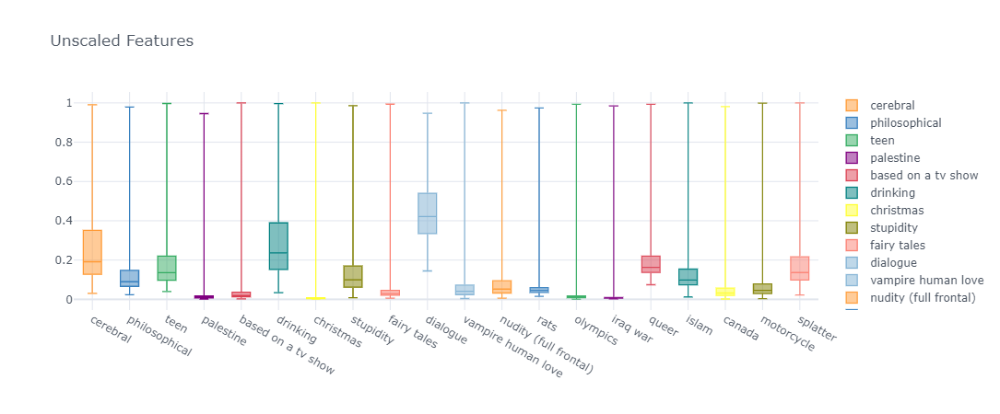

In [10]:
cf.set_config_file(offline=True, world_readable=True, theme='white')
columns = random.sample(range(0, 1129), 20)
pca_data_pivoted.iloc[:,columns].iplot(kind='box', title="Unscaled Features")

In [11]:
def scale_data(data_frame):
    # Initialize StandardScaler
    scaler = StandardScaler(with_std=True)

    # Scale the data
    scaled_data = scaler.fit_transform(data_frame)

    return scaled_data

In [12]:
pca_scaled = scale_data(pca_data_pivoted)

In [13]:
df_pca_scaled = pd.DataFrame(pca_scaled, index = pca_data_pivoted.index, columns = pca_data_pivoted.columns)

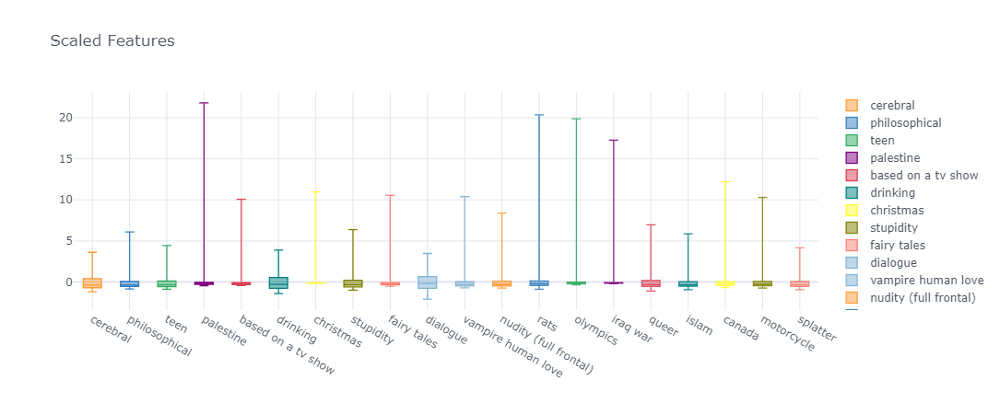

In [14]:
cf.set_config_file(offline=True, world_readable=True, theme='white')
# using plotly to plot the boxplot
df_pca_scaled.iloc[:,columns].iplot(kind='box', title="Scaled Features")

Text(0, 0.5, 'Cumulative explained variance')

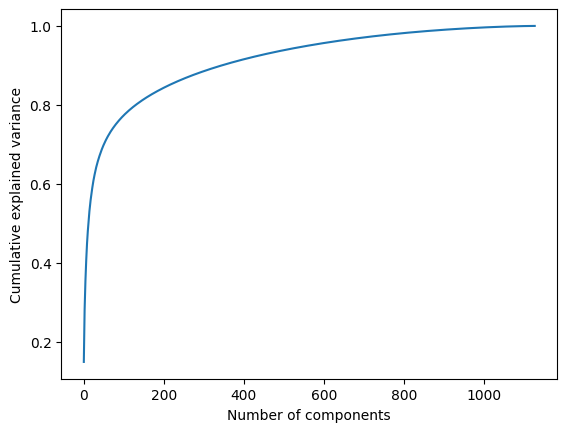

In [15]:
# define PCA object
pca = PCA()

# fit the PCA model to our data and apply the dimensionality reduction 
prin_comp = pca.fit_transform(pca_data_pivoted[features])

# create a dataframe containing the principal components
df_pca = pd.DataFrame(data = prin_comp,
                      index=pca_data_pivoted.index, columns=pca_data_pivoted.columns
                     )

# plot line graph of cumulative variance explained
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In [16]:
# Create a dataframe with the principal components
pca_80 = PCA(.80)
df_pca_80 = pca_80.fit_transform(pca_data_pivoted)
print(round(pca_80.explained_variance_ratio_.sum()*100, 1),
      "% of variance explained by",
      pca_80.n_components_,
      "components.")

80.0 % of variance explained by 131 components.


In [17]:
df_pca_80 = pd.DataFrame(df_pca_80, index = pca_data_pivoted.index)
df_pca_80.head()

,0,1,2,3,4,5,6,7,8,9,...,121,122,123,124,125,126,127,128,129,130
movieId,,,,,,,,,,,,,,,,,,,,,
1,0.796514,2.212839,-2.489444,1.624747,0.984763,1.168046,-0.203300,1.659382,-0.675962,-1.251265,...,-0.166531,0.023522,0.124865,0.091553,-0.014734,-0.082235,0.029796,-0.077556,-0.072878,-0.094931
2,-1.541922,1.597864,-1.113613,1.302526,-0.196336,0.191809,-0.026161,1.208987,-0.369388,-0.483199,...,0.026369,-0.088038,0.113610,-0.050569,-0.015265,0.067904,0.026488,0.013665,0.079228,-0.130822
3,-1.506092,-0.010220,-0.605981,-0.316252,0.330972,0.334078,0.048253,0.010072,-0.042318,0.040345,...,0.060794,-0.101178,0.033077,0.073228,-0.010904,-0.094919,0.019864,0.004834,0.059739,0.035608
4,-1.293604,-0.775662,-0.926582,-0.384600,0.103713,-0.345682,0.683775,0.218370,-0.159426,0.639183,...,-0.036119,-0.145511,0.102927,-0.103027,0.005975,0.053953,0.044405,-0.202070,-0.158430,0.007054
5,-1.694557,-0.185986,-1.204239,-0.149549,0.470713,0.053199,0.385026,0.302557,-0.133082,-0.083749,...,0.016023,0.069098,-0.017486,0.005937,0.127657,-0.019529,-0.327449,-0.137680,-0.053703,0.065995


### 5.2 T-SNE

In [18]:
tsne = TSNE(n_components=2, n_jobs=-1, verbose=2, perplexity=10, learning_rate=0.1)


In [19]:
tsne.fit(scaled_genome_scores)

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.016s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.070463
[t-SNE] Computed conditional probabilities in 0.016s
[t-SNE] Iteration 50: error = 84.5877838, gradient norm = 0.0002152 (50 iterations in 0.289s)
[t-SNE] Iteration 100: error = 84.5877838, gradient norm = 0.0007402 (50 iterations in 0.160s)
[t-SNE] Iteration 150: error = 84.5877762, gradient norm = 0.0028278 (50 iterations in 0.156s)
[t-SNE] Iteration 200: error = 84.5876007, gradient norm = 0.0138733 (50 iterations in 0.157s)
[t-SNE] Iteration 250: error = 84.5825577, gradient norm = 0.0912365 (50 iterations in 0.155s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.582558
[t-SNE] Iteration 300: error = 4.5628805, gradient norm = 0.0321371 (50 iterations in 0.152s)
[t-SNE] Iteration 350: error = 4.5487857, gradient norm = 0.22142

TSNE(learning_rate=0.1, n_jobs=-1, perplexity=10, verbose=2)

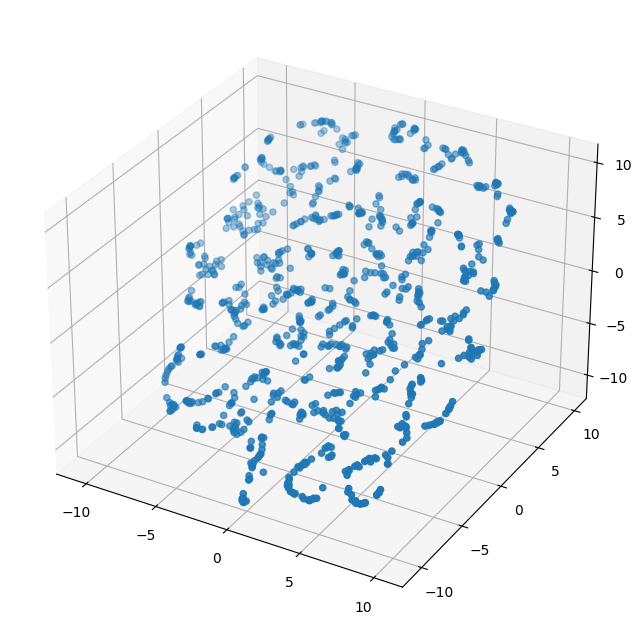

In [20]:
Axes3D

fig = plt.figure(figsize=(15, 8))

# Add 3D scatter plot
ax = fig.add_subplot(projection='3d')
ax.scatter(tsne.embedding_[:,0], tsne.embedding_[:,1], tsne.embedding_[:,1])
plt.show()

# MAYBE

### 5.3 Multidimensional Scaling

In [21]:
print("Computing MDS embedding")
clf = manifold.MDS(n_components=2, 
                   n_init=4, 
                   max_iter=200,
                   n_jobs=-1,
                   random_state=42,
                   dissimilarity='euclidean')
t0 = time()
scaled_genome_scores_mds = clf.fit_transform(scaled_genome_scores)
t1 = time()
print("Done. Stress: %f" % clf.stress_)

Computing MDS embedding


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Done. Stress: 32600.872682


### 5.4 Clustering

In [22]:
# Manually implement the WCSS
def within_cluster_variation(data_frame, label_col='cluster_label'):
    centroids = data_frame.groupby(label_col).mean()
    out = 0
    for label, point in centroids.iterrows():
        data_frame_features = data_frame[data_frame[label_col] == label].drop(label_col, axis=1)
        out += (data_frame_features - point).pow(2).sum(axis=1).sum()
    return out

In [23]:
# Define range of clusters
n_clusters = np.arange(2, 19)

# Define list to store errors
errors = []

# Define for loop for range of clusters
for k in n_clusters:
    print(f'training model with {k} clusters')
    # perform k-means clustering
    km = KMeans(n_clusters=k, n_init=10, max_iter=300, random_state=42)
    df_pca_80.columns = df_pca_80.columns.astype(str)
    km.fit(df_pca_80)
    
    # measure BCSS
    print(f'evaluating model with {k} clusters')
    y_preds = km.predict(df_pca_80)
    df_pca_80 = pd.DataFrame(df_pca_80)
    df_pca_80['cluster_label'] = y_preds
    errors.append(within_cluster_variation(df_pca_80, 'cluster_label'))
    print(errors[-1])

training model with 2 clusters
evaluating model with 2 clusters
167610.0995154783
training model with 3 clusters
evaluating model with 3 clusters
159202.04716452202
training model with 4 clusters
evaluating model with 4 clusters
153979.41324329132
training model with 5 clusters
evaluating model with 5 clusters
149074.8886123466
training model with 6 clusters
evaluating model with 6 clusters
145054.80661973794
training model with 7 clusters
evaluating model with 7 clusters
141701.33766919654
training model with 8 clusters
evaluating model with 8 clusters
139251.25169642267
training model with 9 clusters
evaluating model with 9 clusters
137033.0260749195
training model with 10 clusters
evaluating model with 10 clusters
135148.42670872982
training model with 11 clusters
evaluating model with 11 clusters
132591.03261600246
training model with 12 clusters
evaluating model with 12 clusters
130792.51569023241
training model with 13 clusters
evaluating model with 13 clusters
129498.18906177199

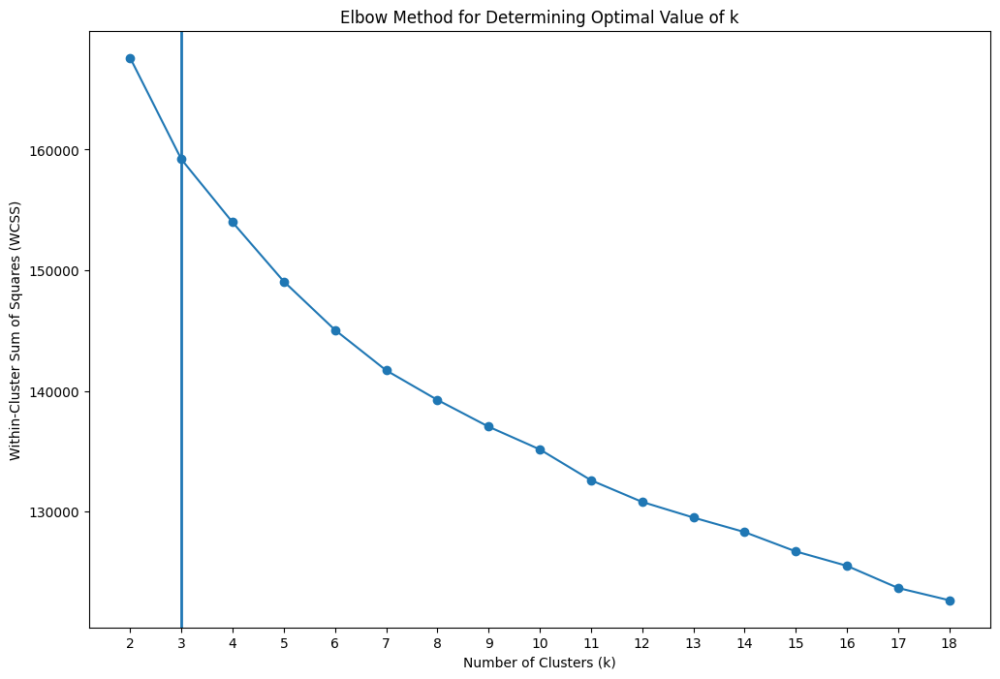

In [24]:
plt.figure(figsize=(12,8))
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Determining Optimal Value of k')
plt.scatter(n_clusters, errors)
plt.plot(n_clusters, errors)
plt.xticks(n_clusters)
plt.axvline(x=3, lw=2)
plt.show()

In [25]:
K = 3
# Remember to set the random state for reproducibility
km = KMeans(n_clusters=K, verbose=0, random_state=42)
print("Clustering sparse data with %s" % km)
t0 = time()
km.fit(df_pca_80)
print("done in %0.3fs" % (time() - t0))

Clustering sparse data with KMeans(n_clusters=3, random_state=42)
done in 1.923s


In [26]:
# Obtain cluster memberships for each item in the data
y_preds = km.predict(df_pca_80)
df_pca_80['cluster_label'] = y_preds
centers = km.cluster_centers_

In [27]:
print(df_pca_80.columns)

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '122', '123', '124', '125', '126', '127', '128', '129', '130',
       'cluster_label'],
      dtype='object', length=132)


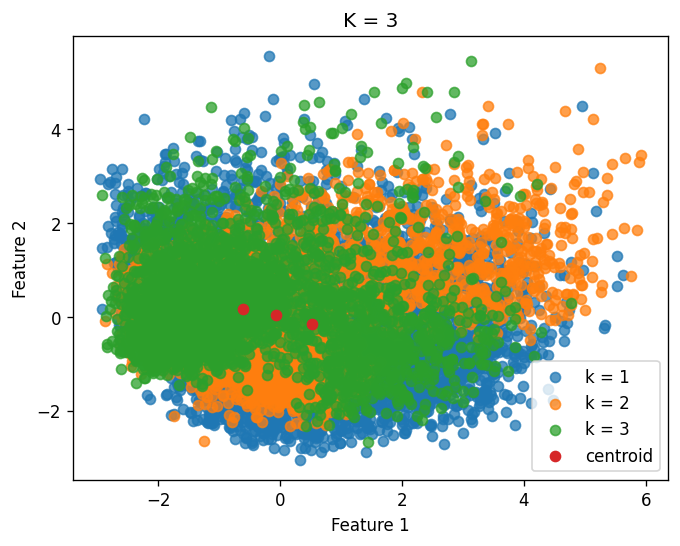

In [28]:
plt.figure(dpi=120)
for k in range(K):
    cluster_data = df_pca_80[df_pca_80['cluster_label'] == k]
    x1 = cluster_data['0']  # Replace '0' with the actual column name for the first principal component
    x2 = cluster_data['1']  # Replace '1' with the actual column name for the second principal component
    plt.scatter(x1, x2, label="k = " + str(k + 1), alpha=0.75)

# Show cluster centroid locations    
plt.scatter(centers[:, 0], centers[:, 1], label="centroid")
plt.legend()
plt.title(f"K = {K}")
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

In [29]:
def data_preprocessing(subset_size):
    # Split genre data into individual words.
    movies['keyWords'] = df_movies['genres'].str.replace('|', ' ')
    # Subset of the data
    movies_subset = movies[:subset_size]
    return movies_subset

<a id="five"></a>
## 6. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

|In this section, we will explore unsupervised modeling. Unsupervised modeling is a branch of machine learning where the algorithm is given data without explicit instructions on what to do with it. The primary goal is to discover patterns, relationships, or inherent structures within the dataset. We will delve into different unsupervised learning techniques.
---

The data will be trained on 100000 inputs from the dataset in order to evaluate the optimal model and identify the model that yeilds the lowest RMSE score. The 5 techniques that will be used include: Singular Value Decomposition, Normal Predictor, BaselineOnly , CoClustering and Non-Negative Matrix Factorisation. 

### 6.1 Collaborative Filtering

In [30]:
# Create training subset of training data
#train_df.drop('timestamp', axis=1, inplace=True)
subset_train = df_train[:100000]
reader = Reader(rating_scale=(subset_train['rating'].min(), subset_train['rating'].max()))
data = Dataset.load_from_df(subset_train[['userId', 'movieId', 'rating']], reader)
trainset, testset = train_test_split(data, test_size=.25, random_state=42)

In [31]:
from surprise import SVD, NormalPredictor, NMF, CoClustering, BaselineOnly, accuracy
from surprise.model_selection import train_test_split
from surprise import Dataset, Reader

def train_test_evaluate_model(model, trainset, testset):
    """
    Trains, tests, and evaluates the given collaborative filtering model.

    Parameters:
    - model: Collaborative filtering model.
    - trainset: Training dataset.
    - testset: Testing dataset.

    Returns:
    - rmse: Root Mean Squared Error on the testset.
    """
    model.fit(trainset)
    predictions = model.test(testset)
    rmse = accuracy.rmse(predictions)
    return rmse

# Initialize collaborative filtering models
svd_model = SVD(n_epochs=30, n_factors=200, init_std_dev=0.05, random_state=42)
np_model = NormalPredictor()
nmf_model = NMF()
cc_model = CoClustering(random_state=42)
bsl_options = {'method': 'sgd', 'n_epochs': 40}
blo_model = BaselineOnly(bsl_options=bsl_options)

# List of models to evaluate
models_to_evaluate = [svd_model, np_model, nmf_model, cc_model, blo_model]
rmse_results = {}

# Train, test, and evaluate each model
for model in models_to_evaluate:
    model_name = model.__class__.__name__
    rmse = train_test_evaluate_model(model, trainset, testset)
    rmse_results[model_name] = rmse

# Print the desired output
#print("RMSE Results:")
for model_name, rmse in rmse_results.items():
    print(f"{model_name}: {rmse}")

RMSE: 0.9746
RMSE: 1.4560
RMSE: 1.1597
RMSE: 1.1514
Estimating biases using sgd...
RMSE: 0.9735
SVD: 0.9746246860850406
NormalPredictor: 1.4559961574970344
NMF: 1.1597216092988791
CoClustering: 1.151442460055227
BaselineOnly: 0.9734634133581382


### 6.2 Content Based

In [32]:

 def content_model(movie_list,top_n=10): 
    # Initializing the empty list of recommended movies
    data = data_preprocessing(2000)
    # Instantiating and generating the count matrix
    count_vec = CountVectorizer()
    count_matrix = count_vec.fit_transform(data['keyWords'])
    indices = pd.Series(data['title'])
    cosine_sim = cosine_similarity(count_matrix, count_matrix)
    cosine_sim = pd.DataFrame(cosine_sim, index = data.index, columns = data.index)
    # Getting the index of the movie that matches the title
    idx_1 = indices[indices == movie_list[0]].index[0]
    idx_2 = indices[indices == movie_list[1]].index[0]
    idx_3 = indices[indices == movie_list[2]].index[0]
    # Creating a Series with the similarity scores in descending order
    rank_1 = cosine_sim[idx_1]
    rank_2 = cosine_sim[idx_2]
    rank_3 = cosine_sim[idx_3]
    # Calculating the scores
    score_series_1 = pd.Series(rank_1).sort_values(ascending = False)
    score_series_2 = pd.Series(rank_2).sort_values(ascending = False)
    score_series_3 = pd.Series(rank_3).sort_values(ascending = False)
    # Getting the indexes of the 10 most similar movies
    listings = score_series_1.append(score_series_2).append(score_series_3).sort_values(ascending = False)
    # Store movie names
    recommended_movies = []
    # Appending the names of movies
    top_50_indexes = list(listings.iloc[1:50].index)
    # Removing chosen movies
    top_indexes = np.setdiff1d(top_50_indexes,[idx_1,idx_2,idx_3])
    for i in top_indexes[:top_n]:
        recommended_movies.append(list(movies['title'])[i])
    return recommended_movies

<a id="seven"></a>
## 7. Model Evaluation
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

|In this section, we will focus on model evaluation, a critical step in assessing the performance and reliability of the machine learning models used. Model evaluation involves using various metrics and techniques to measure how well a model generalizes to new, unseen data. We will discuss commonly used evaluation metrics.  Our exploration will provide insights into the importance of thorough model evaluation for making informed decisions about the suitability and effectiveness of the machine learning models used.
---

In [33]:
#experiment.log_parameters(params)
#experiment.log_metrics(metrics)
#experiment.end()
#experiment.display()

<a id="seven"></a>
## 8. Prepare Submission File
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

|In this section, we will explore the submission file for the Kaggle competition. 
---

In [ ]:
# Train model on whole dataset
reader = Reader(rating_scale=(df_train['rating'].min(), df_train['rating'].max()))
data = Dataset.load_from_df(df_train[['userId', 'movieId', 'rating']], reader)
trainset = data.build_full_trainset()
svd = SVD(n_epochs = 30, n_factors = 300, init_std_dev = 0.005, random_state=42, verbose=True)
svd.fit(trainset)

Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Processing epoch 20
Processing epoch 21
Processing epoch 22
Processing epoch 23
Processing epoch 24


In [ ]:
# Create Kaggle submission file
predictions = []
for i, row in test_df.iterrows():
    x = (svd.predict(row.userId, row.movieId))
    pred = x[3]
    predictions.append(pred)
test_df['Id'] = test_df['userId'].map(str) +'_'+ test_df['movieId'].map(str)
results = pd.DataFrame({"Id":test_df['Id'],"rating": predictions})
results.to_csv("EG1_submission.csv", index=False)

In [ ]:
# Save the model to a file using pickle
model_filename = 'svd_model.pkl'
with open(model_filename, 'wb') as model_file:
    pickle.dump(svd, model_file)

print(f'Model saved to {model_filename}')

<a id="seven"></a>
## 9. Conclusion
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>


<a id="seven"></a>
## 10. References
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>
